# scRNA analysis Memory B cells in HC2 cohort


In [1]:
import glob
import os

import anndata
import h5py
import numpy as np
import scanpy as sc
from matplotlib import pyplot as plt
from scipy.stats import median_abs_deviation

In [1]:
import hisepy as hp

In [2]:
import matplotlib

matplotlib.rcParams["pdf.fonttype"] = 42

In [3]:
# define some color patterns for plotting
nejm_color = [
    "#BC3C29FF",
    "#0072B5FF",
    "#E18727FF",
    "#20854EFF",
    "#7876B1FF",
    "#6F99ADFF",
    "#FFDC91FF",
    "#EE4C97FF",
]
jama_color = [
    "#374E55FF",
    "#DF8F44FF",
    "#00A1D5FF",
    "#B24745FF",
    "#79AF97FF",
    "#6A6599FF",
    "#80796BFF",
]

In [15]:
# define working path
data_path = "/home/workspace/private/ra-cohort-ide/ALTRA_manuscript/immune_health/"
fig_path = "/home/workspace/data/immune_health/figures/Bmem/"
meta_path = "/home/workspace/github/ra-longitudinal/metadata/"
output_path = "/home/workspace/data/ALTRA_manuscript/"
# os.mkdir(fig_path)
# os.mkdir(output_path)
# define a project name
proj_name = "BRI_scRNA_Bmem_"
# sc.set_figure_params(fig_path)
sc.settings.figdir = fig_path
sc.settings.autosave = False
sc.set_figure_params(vector_friendly=False, dpi_save=300)

In [5]:
# set fig size
plt.rcParams["figure.figsize"] = [10, 8]

# load data

In [2]:
hp.cache_files(["ba5c7a01-fa44-49cc-a1f2-9085bc59c7d6"])

['/home/workspace/input/569004694/UCSDCU_Y4/ba5c7a01-fa44-49cc-a1f2-9085bc59c7d6/BRI_scRNA_AIFI_L3_deepclean_match_RAconv_090324.h5ad']

In [6]:
# load the BRI deep clean data
bri_adata = sc.read_h5ad(
    "/home/workspace/input/569004694/UCSDCU_Y4/ba5c7a01-fa44-49cc-a1f2-9085bc59c7d6/BRI_scRNA_AIFI_L3_deepclean_match_RAconv_090324.h5ad"
)

/home/workspace/environment/scanpy/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [7]:
bri_adata.obs["subject.subjectGuid"].unique()

['BR1003', 'BR1008', 'BR1010', 'BR1013', 'BR1015', ..., 'BR2041', 'BR2042', 'BR2046', 'BR2051', 'BR2052']
Length: 29
Categories (29, object): ['BR1003', 'BR1008', 'BR1010', 'BR1013', ..., 'BR2042', 'BR2046', 'BR2051', 'BR2052']

In [8]:
bri_adata.obs.loc[
    bri_adata.obs["AIFI_L3"].str.contains("B"), "AIFI_L3"
].unique().tolist()

['GZMB- CD27+ EM CD4 T cell',
 'GZMB- CD27- EM CD4 T cell',
 'Early memory B cell',
 'Core naive B cell',
 'IL1B+ CD14 monocyte',
 'Activated memory B cell',
 'KLRF1+ GZMB+ CD27- EM CD8 T cell',
 'Type 2 polarized memory B cell',
 'ISG+ naive B cell',
 'Transitional B cell',
 'Core memory B cell',
 'CD95 memory B cell',
 'CD27+ effector B cell',
 'GZMB+ Vd2 gdT',
 'KLRF1- GZMB+ CD27- EM CD8 T cell',
 'KLRF1- GZMB+ CD27- memory CD4 T cell',
 'KLRB1+ memory CD8 Treg',
 'CD27- effector B cell',
 'KLRB1+ memory CD4 Treg',
 'BaEoMaP cell']

In [9]:
bri_adata.obs["AIFI_L1"].unique()

['T cell', 'Monocyte', 'NK cell', 'B cell', 'Progenitor cell', 'DC', 'Platelet', 'ILC', 'Erythrocyte']
Categories (9, object): ['B cell', 'DC', 'Erythrocyte', 'ILC', ..., 'NK cell', 'Platelet', 'Progenitor cell', 'T cell']

In [10]:
# calculate the b cell counts
# total_counts=Bmem_adata.obs.groupby(['sample.sampleKitGuid']).size().reset_index(name='bmem_counts')
b_cell_counts = (
    bri_adata.obs.loc[bri_adata.obs["AIFI_L1"] == "B cell"]
    .groupby(["sample.sampleKitGuid"])
    .size()
    .reset_index(name="total_b_counts")
)

/tmp/ipykernel_11116/1254436917.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bri_adata.obs['AIFI_L1']=='B cell'].groupby(


In [11]:
b_cell_counts

,sample.sampleKitGuid,total_b_counts
0,KT00003,1729
1,KT00012,1340
2,KT00016,1418
3,KT00022,548
4,KT00030,1270
...,...,...
81,KT03913,1585
82,KT03914,1925
83,KT03916,1247
84,KT03918,2239


In [12]:
# seperate out the mem b cells
Bmem_adata = bri_adata[
    bri_adata.obs["AIFI_L3"].str.contains("memory B|effector B"), :
].copy()

In [13]:
# add b_cell_counts
Bmem_adata.obs = Bmem_adata.obs.merge(
    b_cell_counts, how="left", on="sample.sampleKitGuid"
)

In [14]:
Bmem_adata.obs["total_b_counts"]

0        1729
1        1729
2        1729
3        1729
4        1729
         ... 
40327    1585
40328    1585
40329    1585
40330    1585
40331    1585
Name: total_b_counts, Length: 40332, dtype: int64

In [17]:
Bmem_adata

AnnData object with n_obs × n_vars = 40332 × 33538
    obs: 'barcodes', 'original_barcodes', 'cell_name', 'batch_id', 'pool_id', 'chip_id', 'well_id', 'n_genes', 'n_reads', 'n_umis', 'total_counts_mito', 'pct_counts_mito', 'doublet_score', 'predicted_AIFI_L1', 'AIFI_L1_score', 'AIFI_L1', 'predicted_AIFI_L2', 'AIFI_L2_score', 'AIFI_L2', 'predicted_AIFI_L3', 'AIFI_L3_score', 'AIFI_L3', 'sample.sampleKitGuid', 'cohort.cohortGuid', 'subject.subjectGuid', 'subject.biologicalSex', 'subject.cmv', 'subject.bmi', 'subject.race', 'subject.ethnicity', 'subject.birthYear', 'subject.ageAtFirstDraw', 'sample.visitName', 'sample.drawDate', 'sample.subjectAgeAtDraw', 'specimen.specimenGuid', 'pipeline.fileGuid', 'age', 'BMI', 'sample.daysSinceFirstVisit', 'sample.diseaseStatesRecordedAtVisit', 'days_since_first', 'file.batchID', 'total_b_counts'

In [ ]:
# save data
Bmem_adata.write_h5ad(output_path + "BRI_scRNA_Bmem_cells_090424.h5ad")

## run normalization and clustering

In [ ]:
# load data
Bmem_adata = sc.read_h5ad(data_path + "BRI_scRNA_Bmem_cells_090424.h5ad")

In [20]:
# Bmem_adata.obs['subject.subjectGuid'].unique().tolist()

In [ ]:
# save data
Bmem_adata.write_h5ad(data_path + "BRI_scRNA_Bmem_cells_090424.h5ad")

In [21]:
# save the raw counts
Bmem_adata.layers["counts"] = Bmem_adata.X.copy()

In [22]:
# mitochondrial genes
Bmem_adata.var["mt"] = Bmem_adata.var_names.str.startswith("MT-")
# ribosomal genes
Bmem_adata.var["ribo"] = Bmem_adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
Bmem_adata.var["hb"] = Bmem_adata.var_names.str.contains(("^HB[^(P)]"))
sc.pp.calculate_qc_metrics(
    Bmem_adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)

In [23]:
# cpm normalization
sc.pp.normalize_total(Bmem_adata, target_sum=1e4, inplace=True)
sc.pp.log1p(Bmem_adata)

In [24]:
# %%time
sc.pp.highly_variable_genes(Bmem_adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [25]:
Bmem_adata.raw = Bmem_adata

In [26]:
Bmem_adata

AnnData object with n_obs × n_vars = 40332 × 33538
    obs: 'barcodes', 'original_barcodes', 'cell_name', 'batch_id', 'pool_id', 'chip_id', 'well_id', 'n_genes', 'n_reads', 'n_umis', 'total_counts_mito', 'pct_counts_mito', 'doublet_score', 'predicted_AIFI_L1', 'AIFI_L1_score', 'AIFI_L1', 'predicted_AIFI_L2', 'AIFI_L2_score', 'AIFI_L2', 'predicted_AIFI_L3', 'AIFI_L3_score', 'AIFI_L3', 'sample.sampleKitGuid', 'cohort.cohortGuid', 'subject.subjectGuid', 'subject.biologicalSex', 'subject.cmv', 'subject.bmi', 'subject.race', 'subject.ethnicity', 'subject.birthYear', 'subject.ageAtFirstDraw', 'sample.visitName', 'sample.drawDate', 'sample.subjectAgeAtDraw', 'specimen.specimenGuid', 'pipeline.fileGuid', 'age', 'BMI', 'sample.daysSinceFirstVisit', 'sample.diseaseStatesRecordedAtVisit', 'days_since_first', 'file.batchID', 'total_b_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt

In [27]:
sc.pp.scale(Bmem_adata, max_value=10)

In [28]:
# remove ig genes from clustering
def get_ig_genes(adata):
    igl_genes = [gene for gene in adata.var_names if gene.startswith("IGL")]
    igk_genes = [gene for gene in adata.var_names if gene.startswith("IGK")]
    ighc_genes = [gene for gene in adata.var_names if gene.startswith("IGH")]
    exl_genes = igl_genes + igk_genes + ighc_genes
    return exl_genes


# remove ig genes from clustering
ig_genes = get_ig_genes(Bmem_adata)
Bmem_adata.var.loc[Bmem_adata.var.index.isin(ig_genes), "highly_variable"] = False

In [29]:
# setting highly variable as highly deviant to use scanpy 'use_highly_variable' argument in sc.pp.pca
sc.pp.pca(Bmem_adata, svd_solver="arpack", use_highly_variable=True)

/home/workspace/environment/scanpy/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


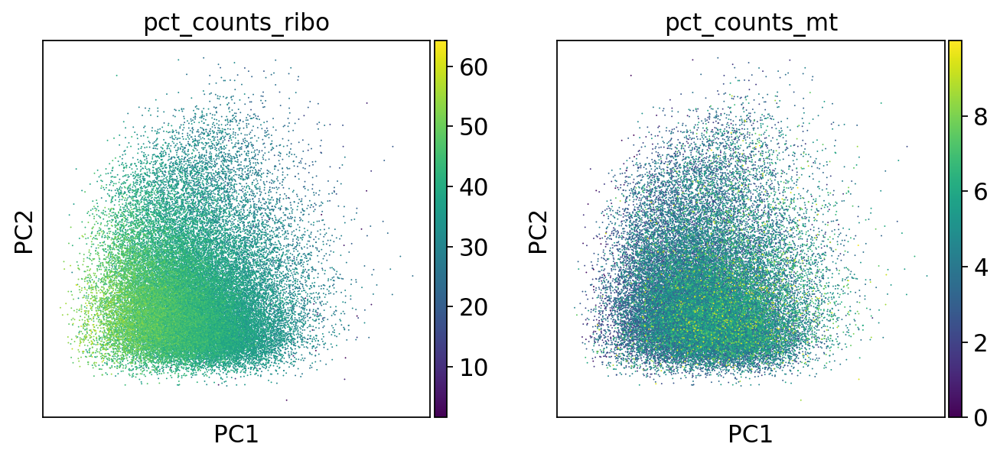

In [30]:
sc.pl.pca_scatter(Bmem_adata, color=["pct_counts_ribo", "pct_counts_mt"])

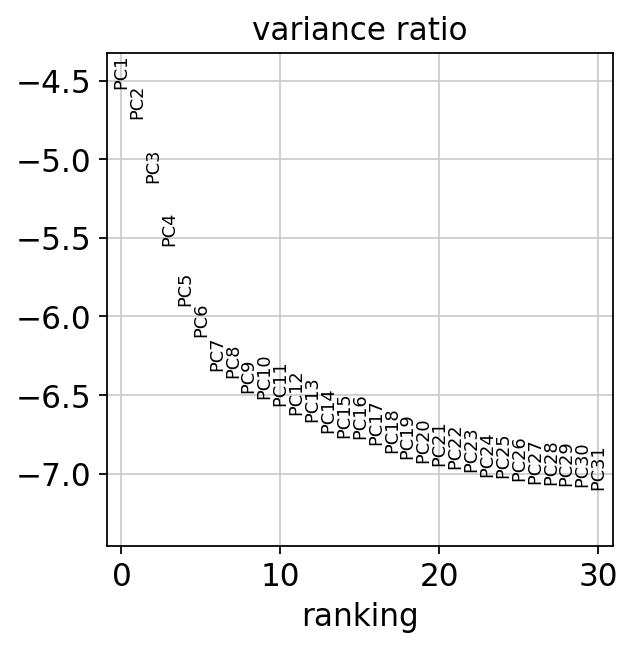

In [32]:
# plot the principle component variance explained
sc.pl.pca_variance_ratio(Bmem_adata, log=True)

In [33]:
sc.pp.neighbors(Bmem_adata, n_pcs=12, use_rep="X_pca")
sc.tl.umap(Bmem_adata)

/home/workspace/environment/scanpy/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


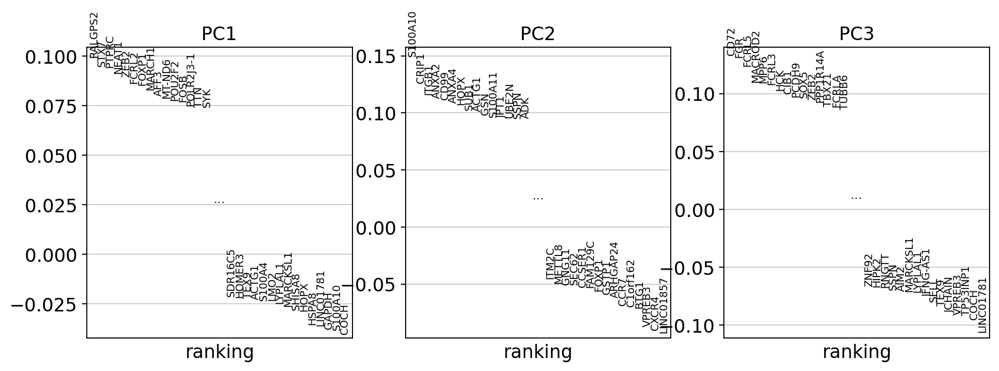

In [36]:
sc.pl.pca_loadings(Bmem_adata, components="1,2,3")

In [37]:
sc.tl.leiden(
    Bmem_adata,
    key_added="leiden_1",
    resolution=1,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)

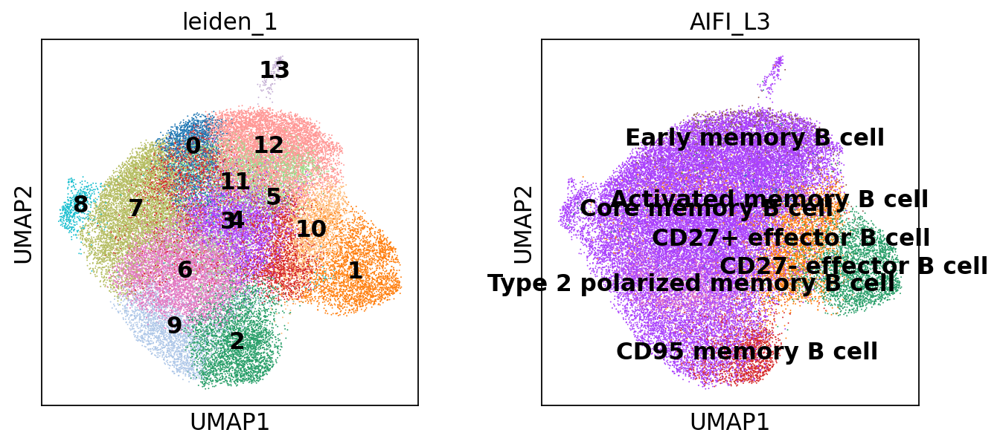

In [39]:
sc.pl.umap(
    Bmem_adata,
    legend_loc="on data",
    color=["leiden_1", "AIFI_L3"],
    ncols=3,
    save=proj_name + "_cluster_umap.png",
)

In [40]:
# run clusters within the switched effector cells
sc.tl.leiden(
    Bmem_adata,
    restrict_to=["leiden_1", ["1"]],
    key_added="leiden_1_sub",
    resolution=0.15,
)

/tmp/ipykernel_11116/2848180141.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(Bmem_adata, restrict_to = ['leiden_1', ['1']], key_added='leiden_1_sub', resolution=0.15)


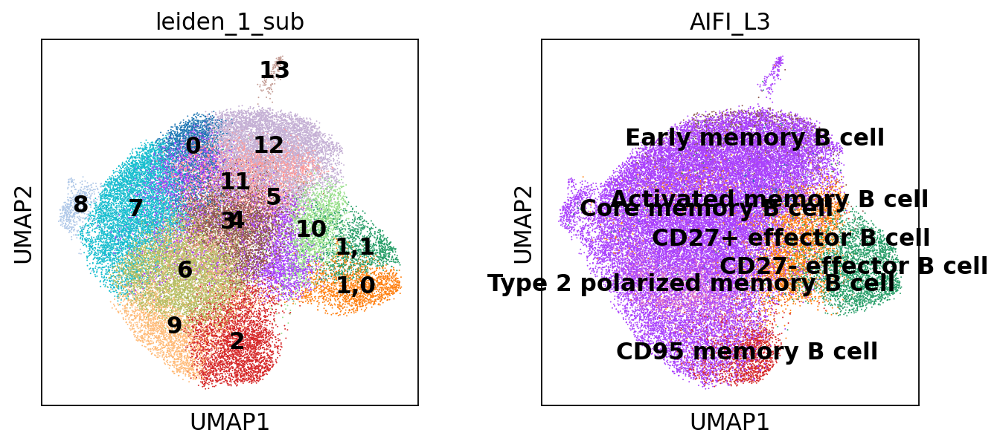

In [41]:
sc.pl.umap(
    Bmem_adata,
    legend_loc="on data",
    color=["leiden_1_sub", "AIFI_L3"],
    save=proj_name + "_leiden_1_sub_umap.pdf",
)

In [42]:
# Bmem_adata.obs['leiden_1_sub'] = Bmem_adata.obs['leiden_1_sub'].astype('str').replace({'3,1':'3', '3,1':'13'}).astype('category')

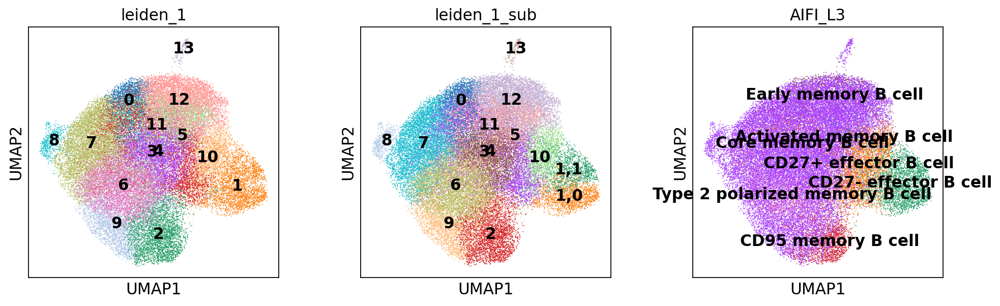

In [43]:
sc.pl.umap(
    Bmem_adata,
    legend_loc="on data",
    color=["leiden_1", "leiden_1_sub", "AIFI_L3"],
    ncols=3,
    save=proj_name + "_cluster_umap.png",
)

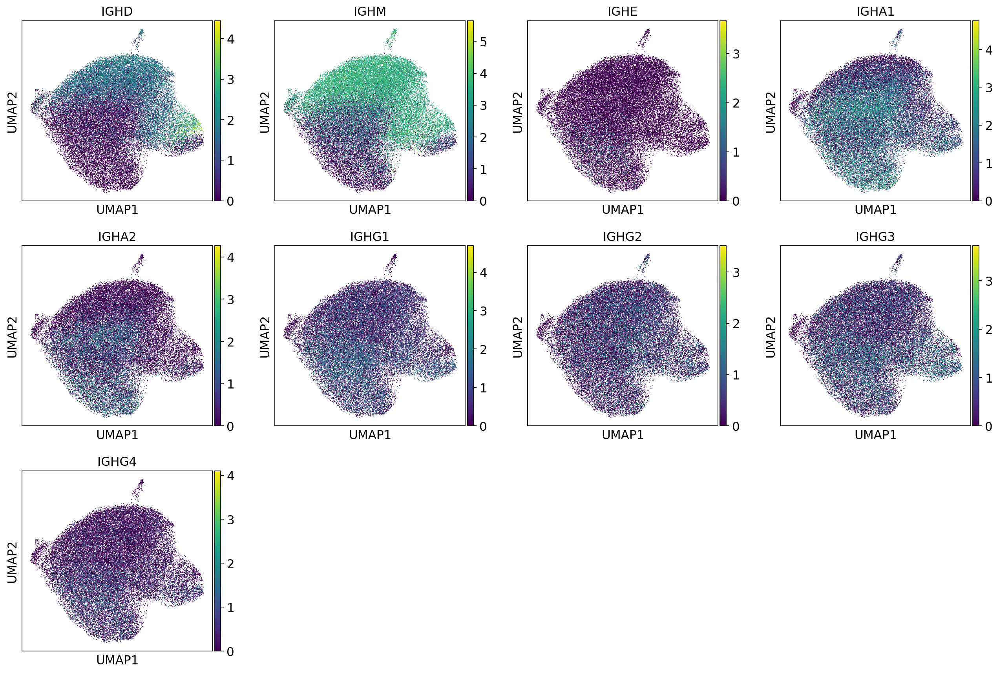

In [44]:
ig_genes = [
    "IGHD",
    "IGHM",
    "IGHE",
    "IGHA1",
    "IGHA2",
    "IGHG1",
    "IGHG2",
    "IGHG3",
    "IGHG4",
]
sc.pl.umap(Bmem_adata, color=ig_genes, save=proj_name + "_B_ig_genes_umap.png")

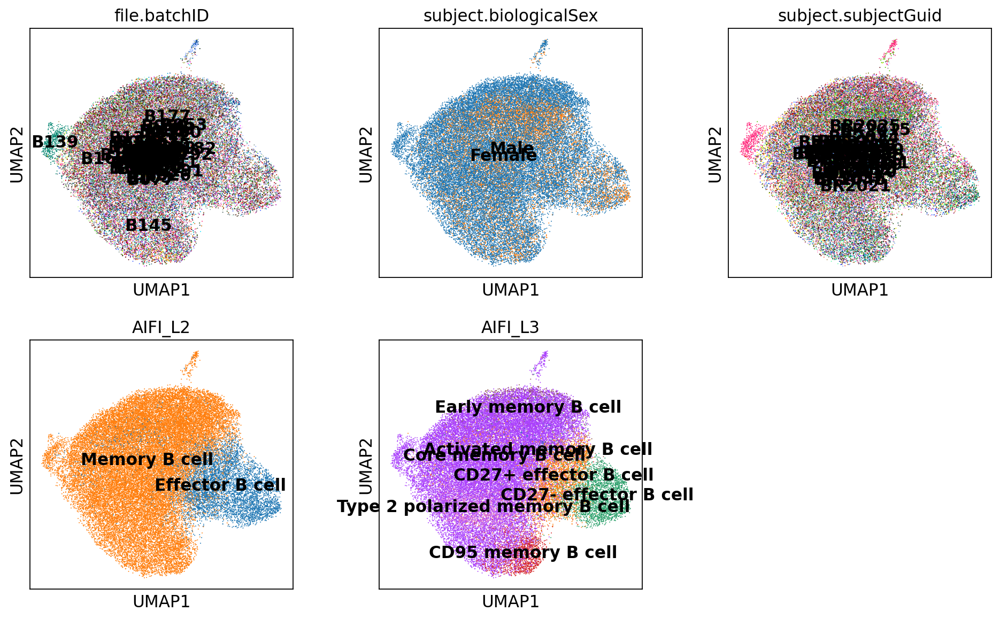

In [45]:
sc.pl.umap(
    Bmem_adata,
    legend_loc="on data",
    color=[
        "file.batchID",
        "subject.biologicalSex",
        "subject.subjectGuid",
        "AIFI_L2",
        "AIFI_L3",
    ],
    ncols=3,
    save=proj_name + "_rna_leiden_1_2_labels_umap.png",
)

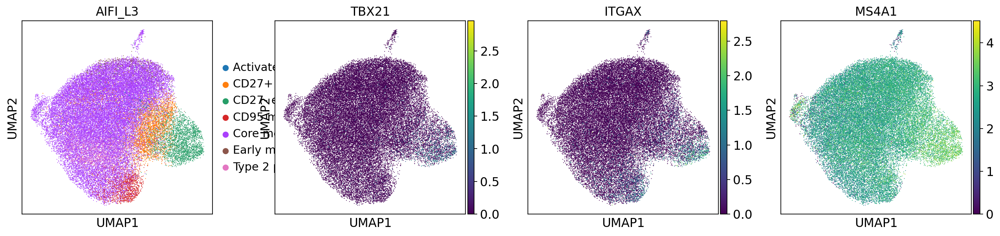

In [46]:
sc.pl.umap(
    Bmem_adata,  # legend_loc='on data',
    color=["AIFI_L3", "TBX21", "ITGAX", "MS4A1"],
    save=proj_name + "_immunehealth_l3_TBX21_umap.png",
)

In [47]:
# test for top genes that seperate the cells
cluster_name = "leiden_1_sub"
sc.tl.rank_genes_groups(
    Bmem_adata,
    groupby=cluster_name,
    method="wilcoxon",
    key_added="leiden_1_sub_wilcoxon_test",
)

In [49]:
leiden_deg = sc.get.rank_genes_groups_df(
    Bmem_adata, key="leiden_1_sub_wilcoxon_test", pval_cutoff=None, group=None
).rename({"group": cluster_name}, axis="columns")
leiden_deg

,leiden_1_sub,names,scores,logfoldchanges,pvals,pvals_adj
0,0,LINC01857,22.791788,1.364739,5.531129e-115,1.855030e-110
1,0,IGHM,22.321609,1.531719,2.279390e-110,3.822309e-106
2,0,RPS3,21.218145,0.248268,6.493520e-100,7.259322e-96
3,0,RPS23,20.700031,0.200030,3.461391e-95,1.934802e-91
4,0,RPL30,19.384033,0.180559,1.052635e-83,5.043325e-80
...,...,...,...,...,...,...
503065,13,RPS18,-14.165815,-0.647547,1.491254e-45,5.557074e-42
503066,13,RPS13,-14.256787,-0.642458,4.067519e-46,1.705206e-42
503067,13,RPL37,-14.406352,-0.701730,4.719914e-47,2.638274e-43
503068,13,BANK1,-14.485770,-2.305342,1.490434e-47,9.997238e-44


In [50]:
# output the deg list
cluster_name = "leiden_1_sub"
leiden_deg = sc.get.rank_genes_groups_df(
    Bmem_adata, key=cluster_name + "_wilcoxon_test", pval_cutoff=None, group=None
).rename({"group": cluster_name}, axis="columns")
leiden_deg["direction"] = np.where(leiden_deg["logfoldchanges"] > 0, "up", "down")
leiden_deg = leiden_deg.reindex(
    leiden_deg["scores"].abs().sort_values(ascending=False).index
)
leiden_deg.to_csv(output_path + proj_name + cluster_name + "_wilcoxon_degs.csv")

In [51]:
leiden_deg["leiden_1_sub"].unique().tolist()

['11',
 '7',
 '2',
 '9',
 '6',
 '12',
 '1,0',
 '1,1',
 '4',
 '10',
 '3',
 '8',
 '0',
 '13',
 '5']

In [52]:
sc.tl.dendrogram(Bmem_adata, groupby=cluster_name)

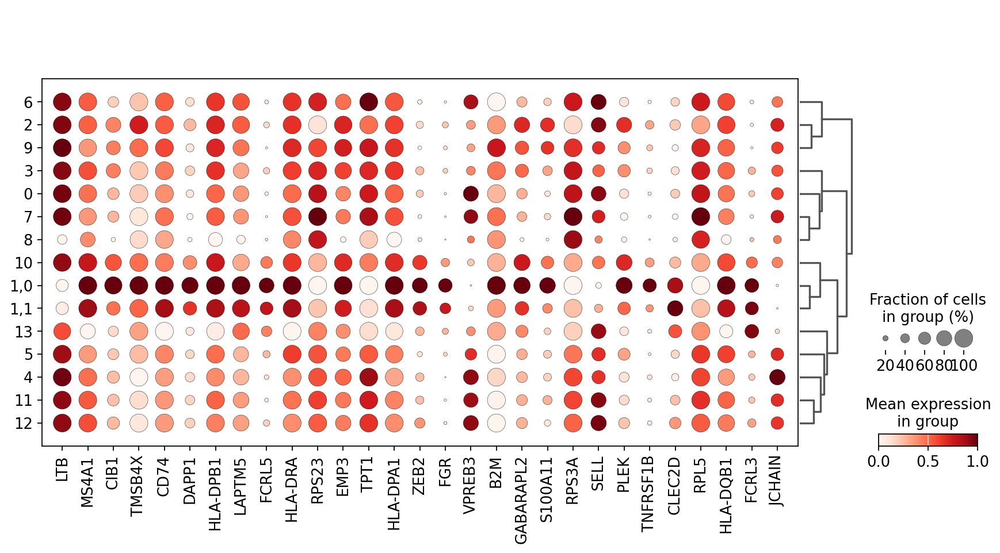

In [53]:
# check cluster 10 degs
# cluster_name = 'leiden_1'
# leiden_deg = pd.read_csv(output_path + proj_name + cluster_name+'_wilcoxon_degs.csv')
c3_1_deg = leiden_deg.loc[
    (leiden_deg["leiden_1_sub"] == "1,0") & (leiden_deg["pvals_adj"] < 0.01)
]
sc.pl.dotplot(
    Bmem_adata,
    c3_1_deg["names"][0:29].to_list(),
    groupby=cluster_name,
    standard_scale="var",
    dendrogram=True,
    swap_axes=False,
    save="_" + proj_name + cluster_name + "_c3_1_dotplot_scale.png",
)

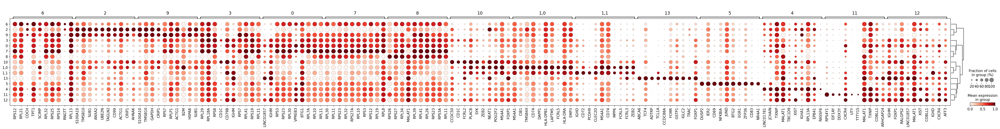

In [55]:
# plot top degs
sc.tl.dendrogram(Bmem_adata, groupby=cluster_name)
sc.pl.rank_genes_groups_dotplot(
    Bmem_adata,
    groupby=cluster_name,
    standard_scale="var",
    n_genes=10,
    key=cluster_name + "_wilcoxon_test",
    save="_" + proj_name + cluster_name + "_wilcoxon_top_genes_dotplot_scale.png",
)

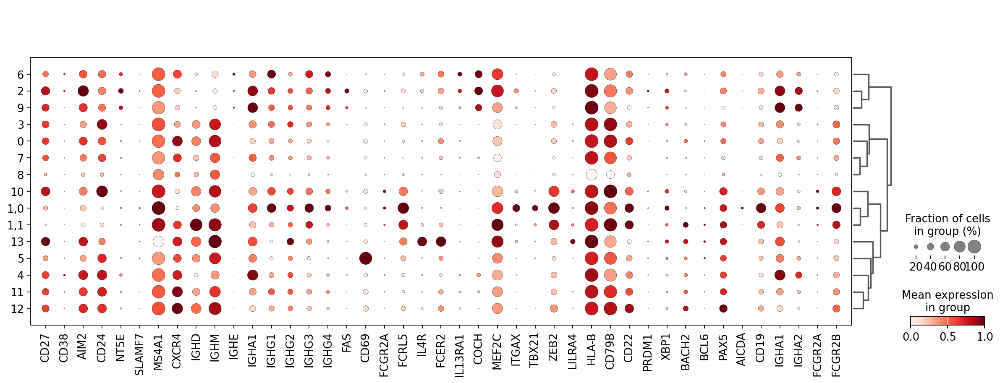

In [56]:
# plot marker genes from the annoatation table
marker_genes = [
    "CD27",
    "CD38",
    "AIM2",
    "CD24",
    "NT5E",
    "SLAMF7",
    "MS4A1",
    "CXCR4",
    "IGHD",
    "IGHM",
    "IGHE",
    "IGHA1",
    "IGHG1",
    "IGHG2",
    "IGHG3",
    "IGHG4",
    "FAS",
    "CD69",
    "FCGR2A",
    "FCRL5",
    "IL4R",
    "FCER2",
    "IL13RA1",
    "COCH",
    "MEF2C",
    "ITGAX",
    "TBX21",
    "ZEB2",
    "LILRA4",
    "HLA-B",
    "CD79B",
    "CD22",
    "PRDM1",
    "XBP1",
    "BACH2",
    "BCL6",
    "PAX5",
    "AICDA",
    "CD19",
    "IGHA1",
    "IGHA2",
    "FCGR2A",
    "FCGR2B",
]
sc.pl.dotplot(
    Bmem_adata,
    marker_genes,
    groupby=cluster_name,
    standard_scale="var",
    dendrogram=True,
    swap_axes=False,
    save="_" + proj_name + cluster_name + "_marker_genes_dotplot_scale.png",
)

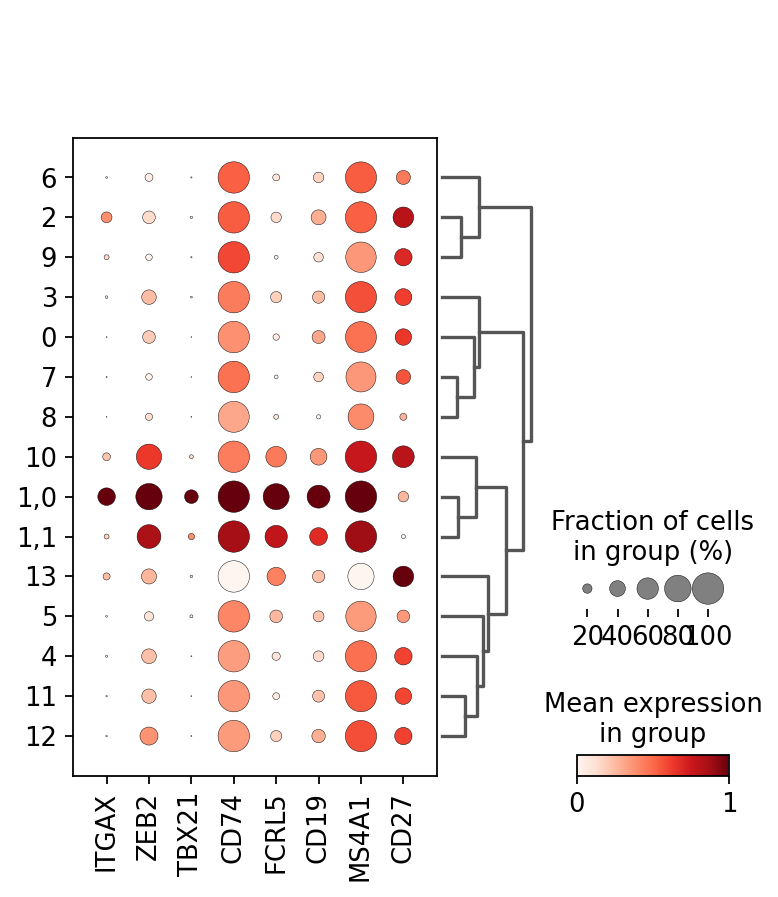

In [57]:
# plot marker genes from the annoatation table
marker_genes = ["ITGAX", "ZEB2", "TBX21", "CD74", "FCRL5", "CD19", "MS4A1", "CD27"]
cluster_name = "leiden_1_sub"
sc.pl.dotplot(
    Bmem_adata,
    marker_genes,
    groupby=cluster_name,
    standard_scale="var",
    dendrogram=True,
    swap_axes=False,
    save="_" + proj_name + cluster_name + "_marker_genes_dotplot_scale.pdf",
)

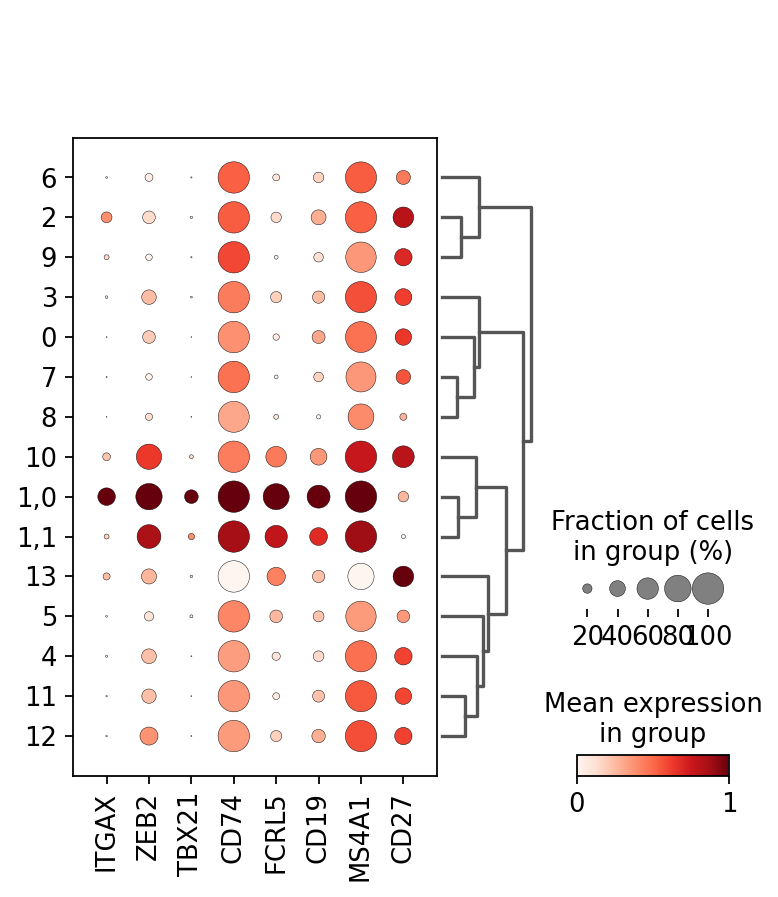

In [58]:
# plot marker genes from the annoatation table
marker_genes = ["ITGAX", "ZEB2", "TBX21", "CD74", "FCRL5", "CD19", "MS4A1", "CD27"]
cluster_name = "leiden_1_sub"
sc.pl.dotplot(
    Bmem_adata,
    marker_genes,
    groupby=cluster_name,
    standard_scale="var",
    dendrogram=True,
    swap_axes=False,
    save="_" + proj_name + cluster_name + "_marker_genes_dotplot_scale.pdf",
)

In [59]:
# save data
Bmem_adata.write_h5ad(output_path + "BRI_scRNA_Bmem_cells_090424.h5ad")

In [3]:
# upload file to hise
hp.upload.upload_files(
    files=["/home/workspace/data/ALTRA_manuscript/BRI_scRNA_Bmem_cells_090424.h5ad"],
    study_space_id="223de760-9624-45bd-aefe-ca24c75b1800",
    title="ALTRA CON2 scRNA Memory B cells h5ad object",
    input_file_ids=["ba5c7a01-fa44-49cc-a1f2-9085bc59c7d6"],
    do_conda_build_check=False,
)

Cannot determine the current notebook.
1) /home/workspace/github/ALTRA-manuscript/Analysis/scRNA/Longitudinal_analysis/04b_Python_scRNA_Bmem_CON2_analysis.ipynb
2) /home/workspace/.virtual_documents/github/ALTRA-manuscript/Analysis/scRNA/Longitudinal_analysis/04b_Python_scRNA_Bmem_CON2_analysis.ipynb
3) /home/workspace/github/ALTRA-manuscript/Analysis/scRNA/Longitudinal_analysis/04a_Python_scRNA_Bmem_analysis.ipynb
Please select (1-3) 


 1


{'Message': 'General Okay-ness',
 'VisualizationId': '00000000-0000-0000-0000-000000000000',
 'AbstractionId': '00000000-0000-0000-0000-000000000000',
 'TraceId': '0c12b34c-1b43-4a35-8f56-070c2ade33f0',
 'ProcessId': '0199d47c-30f1-440c-9e33-e5adf390d209',
 'WorkflowId': '16f1758f-9fdb-47d0-97ee-bb814c31de07',
 'FileIds': ['517d3f25-27dd-4643-af33-13f3e11ddbcd']}

In [ ]:
# save data
Bmem_adata_eff.write_h5ad(data_path + "BRI_scRNA_Beffecter_cells.h5ad")

## calculate the frequency of each clusters

In [5]:
# get monocytes subset freuqency
cluster_name = "leiden_1_sub"
Bmem_freq = sct.tools.relative_frequency_per_cluster(
    Bmem_adata, group_by="sample.sampleKitGuid", xlabel=cluster_name
)
Bmem_freq = (
    Bmem_freq.set_index(["sample.sampleKitGuid"])
    .melt(ignore_index=False, var_name="cluster", value_name="bmem_frequency")
    .reset_index()
)
# add cell counts
cell_counts = (
    Bmem_adata.obs.groupby(["sample.sampleKitGuid", cluster_name])
    .size()
    .reset_index(name="counts")
)
total_counts = (
    Bmem_adata.obs.groupby(["sample.sampleKitGuid"])
    .size()
    .reset_index(name="bmem_counts")
)
cell_counts = cell_counts.merge(
    total_counts, how="left", on=["sample.sampleKitGuid"]
).rename({cluster_name: "cell_type"}, axis=1)
# add metadata to it
Bmem_freq = (
    Bmem_freq.merge(
        Bmem_adata.obs.loc[
            :,
            [
                "sample.sampleKitGuid",
                "subject.subjectGuid",
                "subject.biologicalSex",
                "age",
                "sample.drawDate",
                "sample.daysSinceFirstVisit",
                "sample.diseaseStatesRecordedAtVisit",
                "days_since_first",
                "total_b_counts",
                "file.batchID",
            ],
        ].drop_duplicates(),
        how="left",
        on="sample.sampleKitGuid",
    )
    .rename({"cluster": "cell_type"}, axis=1)
    .merge(cell_counts, how="left", on=["sample.sampleKitGuid", "cell_type"])
)
# total b cell counts and frequency of B cells
# Bmem_freq = Bmem_freq.merge(b_cell_counts, how='left', on='sample.sampleKitGuid')
Bmem_freq["b_frequency"] = Bmem_freq["counts"] / Bmem_freq["total_b_counts"]

In [ ]:
Bmem_freq["cell_type"] = Bmem_freq["cell_type"].replace({"1,0": "1_0", "1,1": "1_1"})

In [ ]:
Bmem_freq["cell_type"].unique()

In [ ]:
Bmem_freq.to_csv(output_path + proj_name + "B_mem_effector_leiden_1_sub_freq.csv")

In [10]:
# upload file to hise
hp.upload.upload_files(
    files=[
        "/home/workspace/data/immune_health/BRI_scRNA_Bmem_B_mem_effector_leiden_1_sub_freq.csv",
    ],
    study_space_id="223de760-9624-45bd-aefe-ca24c75b1800",
    title="AlTRA scRNA Memory B cells effector cluster frequency",
    input_file_ids=["ba5c7a01-fa44-49cc-a1f2-9085bc59c7d6"],
    do_conda_build_check=False,
)

{'Message': 'General Okay-ness',
 'VisualizationId': '00000000-0000-0000-0000-000000000000',
 'AbstractionId': '00000000-0000-0000-0000-000000000000',
 'TraceId': '3c319d37-035b-4d60-8e5a-344e6abc5a83',
 'ProcessId': 'fc9ee11b-ce7a-41ee-9de6-7f4190f669fa',
 'WorkflowId': '39eb36d9-a91f-4aae-a069-7d5c189034ac',
 'FileIds': ['ae2a8a0f-943c-475e-a712-906c6bfd9c6b']}

# Session Info

In [11]:
import sinfo

sinfo.sinfo(write_req_file=False)

-----
hisepy      0.3.0
sinfo       0.3.1
-----
IPython             8.30.0
jupyter_client      8.6.3
jupyter_core        5.7.2
-----
Python 3.11.9 | packaged by conda-forge | (main, Apr 19 2024, 18:36:13) [GCC 12.3.0]
Linux-6.6.87+-x86_64-with-glibc2.35
64 logical CPU cores, x86_64
-----
Session information updated at 2025-08-02 22:47
